In [1]:
import matplotlib.pyplot as plt

from srm import catalog
from srm.analysis import BCSDRun, load_nasa_nex
from srm.bcsd_config import BCSDConfig, PipelineOptions, VariableConfig
from srm.plotting import (
    calculate_statistic_to_plot,
    get_4_subregions,
    locations,
    plot_4regions_comparisons,
    plot_comparisons,
    plot_timeseries,
    prep_datasets_for_seasonal_cycle_plotting,
    random_non_leap_year,
)

# Get data

In [2]:
training_period = slice("1984-01-01", "2014-12-31")
testing_period = slice("2080-01-01", "2100-12-31")
variables = ["tas"]

### Raw data

In [3]:
gcm = "CESM2-WACCM"
scenario = "historical"  # "historical", "SSP245", "G6-1.5K"
dataset_name = f"{gcm}-{scenario}-icechunk"
raw = (
    catalog.get(dataset_name)
    .to_xarray()[variables]
    .isel(ensemble_member=2)
    .sel(time=training_period)
)

In [4]:
gcm = "CESM2-WACCM"
scenario = "SSP245"  # "historical", "SSP245", "G6-1.5K"
dataset_name = f"{gcm}-{scenario}-icechunk"

raw_fut_full = catalog.get(dataset_name).to_xarray()[variables].isel(ensemble_member=2)
raw_fut = raw_fut_full.sel(time=testing_period)

### ERA5

In [5]:
era5 = catalog.get("ERA5").to_xarray()
era5 = era5[variables].sel(time=training_period)

### Downscaled data

In [6]:
vc = VariableConfig.for_variable("tas").model_copy(update={"do_windowing": True})
bcsd_config = BCSDConfig(
    gcm="CESM2-WACCM",
    variable="tas",
    ensemble_member="r3i1p1f1",
    scenario="ssp245",
    predict_period_start=2015,
    predict_period_end=2100,
    variable_config=vc,
    debias_approach="nonparametric_hybrid",
)
options = PipelineOptions(
    output_dir="s3://carbonplan-scratch/srm/outputs/",
    branch="v0.6.0run2",
)
r = BCSDRun(bcsd_config, options)

In [7]:
ds_cp_tas = r.historical.sel(time=training_period)
ds_cp_tas_fut_full = r.scenario
ds_cp_tas_fut = ds_cp_tas_fut_full.sel(time=testing_period)

### NASA NEX

In [8]:
ds_nn_tas = load_nasa_nex(dataset="historical").isel(ensemble_member=0).sel(time=training_period)

/opt/coiled/env/lib/python3.13/site-packages/zarr/codecs/numcodecs/_codecs.py:141: ZarrUserWarning: Numcodecs codecs are not in the Zarr version 3 specification and may not be supported by other zarr implementations.
  super().__init__(**codec_config)


In [9]:
ds_nn_tas_fut_full = load_nasa_nex(dataset="ssp245").isel(ensemble_member=0)
ds_nn_tas_fut = ds_nn_tas_fut_full.sel(time=testing_period)

/opt/coiled/env/lib/python3.13/site-packages/zarr/codecs/numcodecs/_codecs.py:141: ZarrUserWarning: Numcodecs codecs are not in the Zarr version 3 specification and may not be supported by other zarr implementations.
  super().__init__(**codec_config)


# Compare NASA NEX Historical

## Global comparisons

### Mean temperature

In [10]:
raw_tas_toplot, era5_tas_toplot, ds_cp_tas_toplot, ds_nn_tas_toplot = calculate_statistic_to_plot(
    ds_list=[raw, era5, ds_cp_tas, ds_nn_tas],
    stat="mean",
    variable="tas",
)

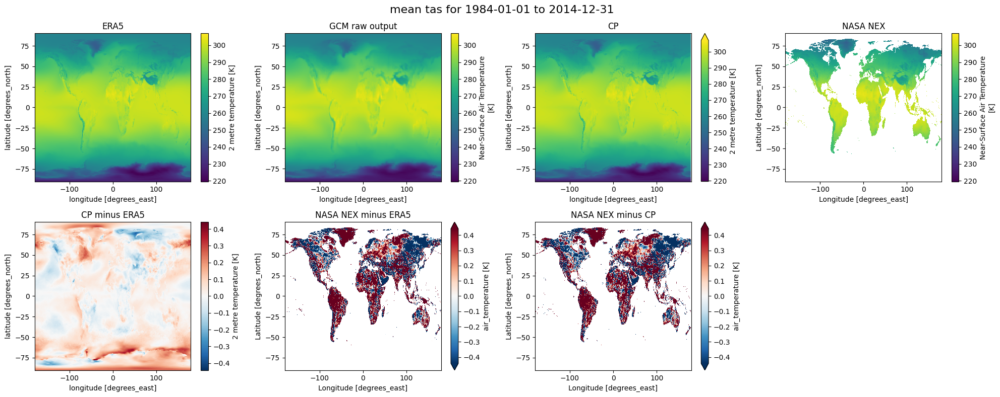

In [11]:
plot_comparisons(
    era5_tas_toplot,
    raw_tas_toplot,
    ds_cp_tas_toplot,
    ds1_name="CP",
    ds2=ds_nn_tas_toplot,
    ds2_name="NASA NEX",
    title=f"mean tas for {training_period.start} to {training_period.stop}",
)

### Hottest day

In [ ]:
(
    raw_hottest_day_toplot,
    era5_hottest_day_toplot,
    ds_cp_hottest_day_toplot,
    ds_nn_hottest_day_toplot,
) = calculate_statistic_to_plot(
    ds_list=[raw, era5, ds_cp_tas, ds_nn_tas],
    stat="hottest_day",
    variable="tas",
)

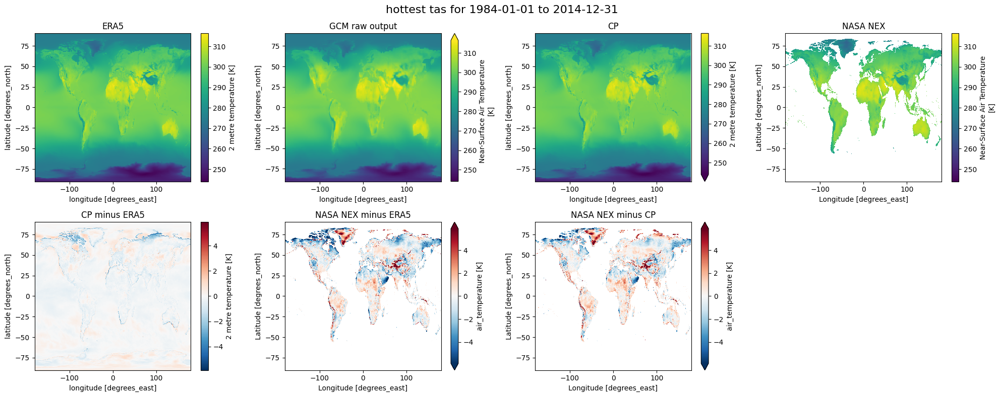

In [14]:
plot_comparisons(
    era5_hottest_day_toplot,
    raw_hottest_day_toplot,
    ds_cp_hottest_day_toplot,
    ds2=ds_nn_hottest_day_toplot,
    ds1_name="CP",
    ds2_name="NASA NEX",
    title=f"hottest tas for {training_period.start} to {training_period.stop}",
)

### Days over 30C

In [ ]:
raw_over30C_toplot, era5_over30C_toplot, ds_cp_over30C_toplot, ds_nn_over30C_toplot = (
    calculate_statistic_to_plot(
        ds_list=[raw, era5, ds_cp_tas, ds_nn_tas], stat="days_over_30C", variable="tas"
    )
)

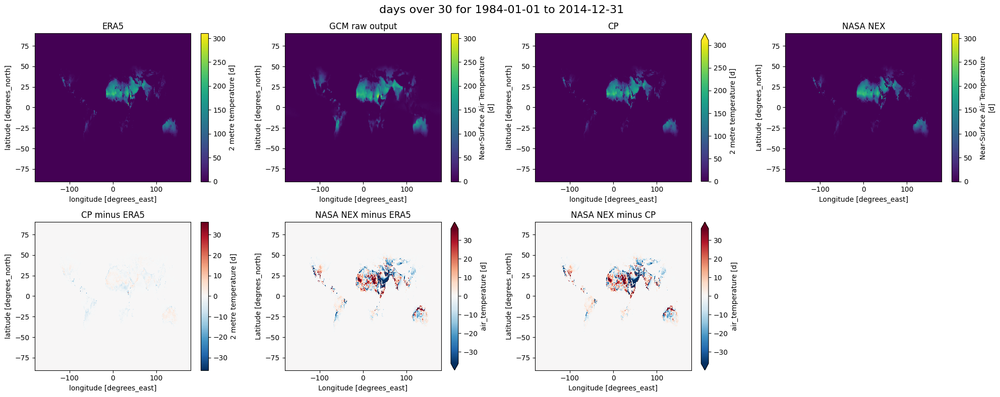

In [17]:
plot_comparisons(
    era5_over30C_toplot,
    raw_over30C_toplot,
    ds_cp_over30C_toplot,
    ds2=ds_nn_over30C_toplot,
    ds1_name="CP",
    ds2_name="NASA NEX",
    title=f"days over 30 for {training_period.start} to {training_period.stop}",
)

## Regional comparisons

In [18]:
raw_sub = get_4_subregions(raw)
era5_sub = get_4_subregions(era5)
ds_cp_sub = get_4_subregions(ds_cp_tas)
ds_nn_sub = get_4_subregions(ds_nn_tas)

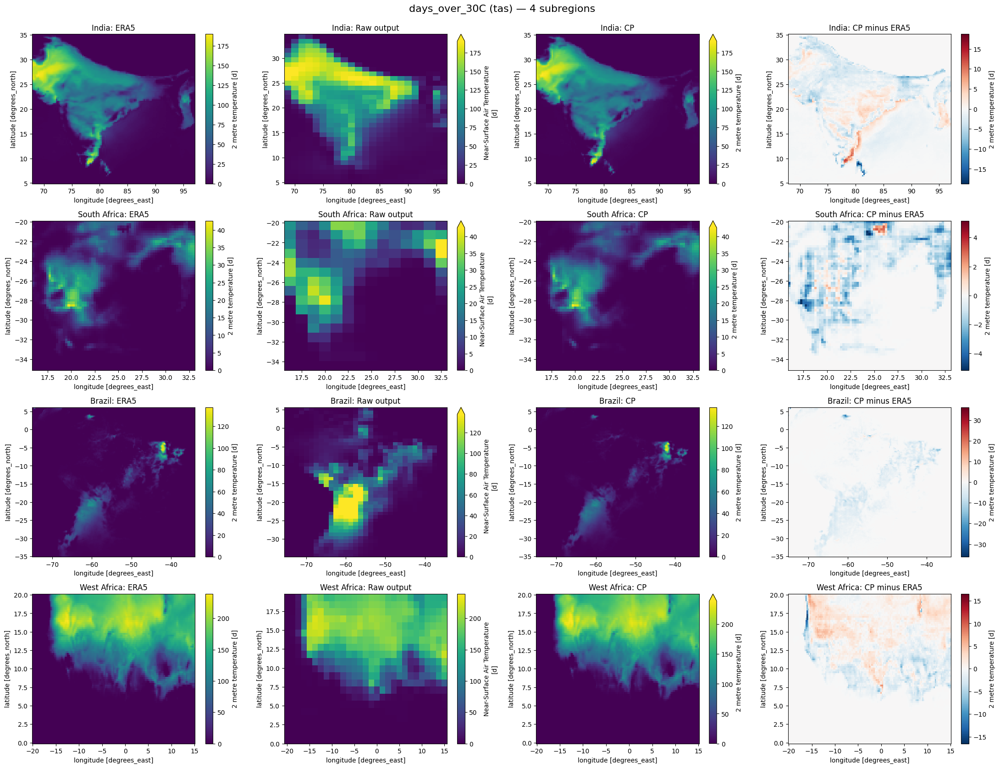

In [19]:
fig = plot_4regions_comparisons(
    raw=raw,
    era5=era5,
    ds1=ds_cp_tas,
    stat="days_over_30C",
    variable="tas",
    ds1_title="CP",
)
plt.show()

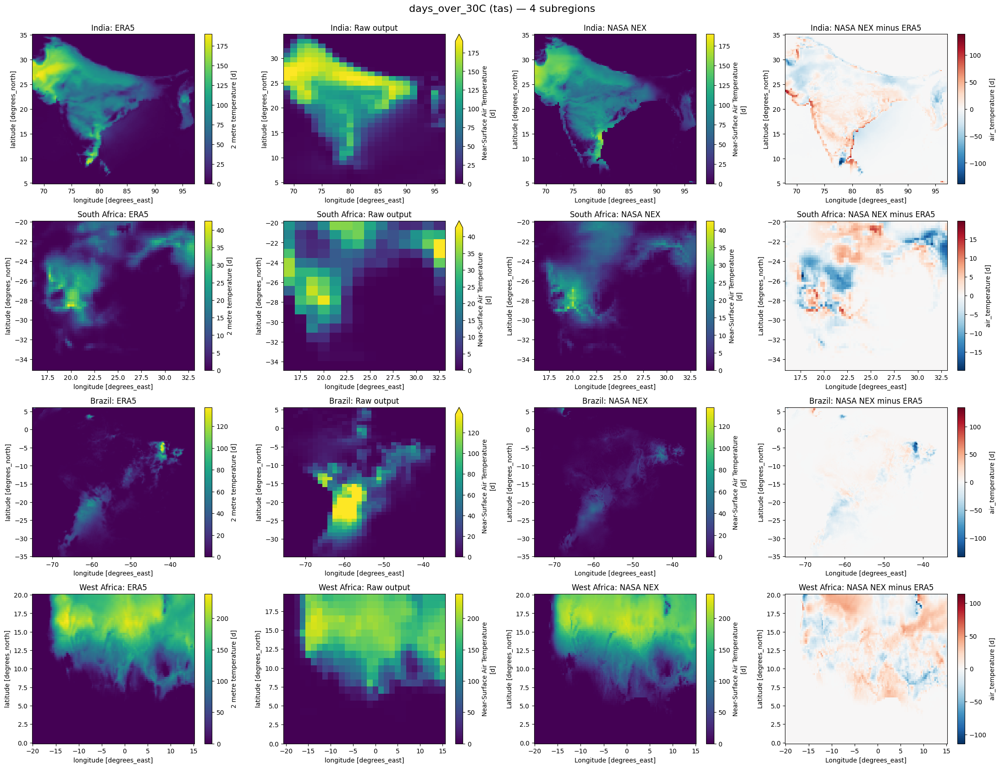

In [20]:
fig = plot_4regions_comparisons(
    raw=raw,
    era5=era5,
    ds1=ds_nn_tas,
    stat="days_over_30C",
    variable="tas",
    ds1_title="NASA NEX",
)
plt.show()

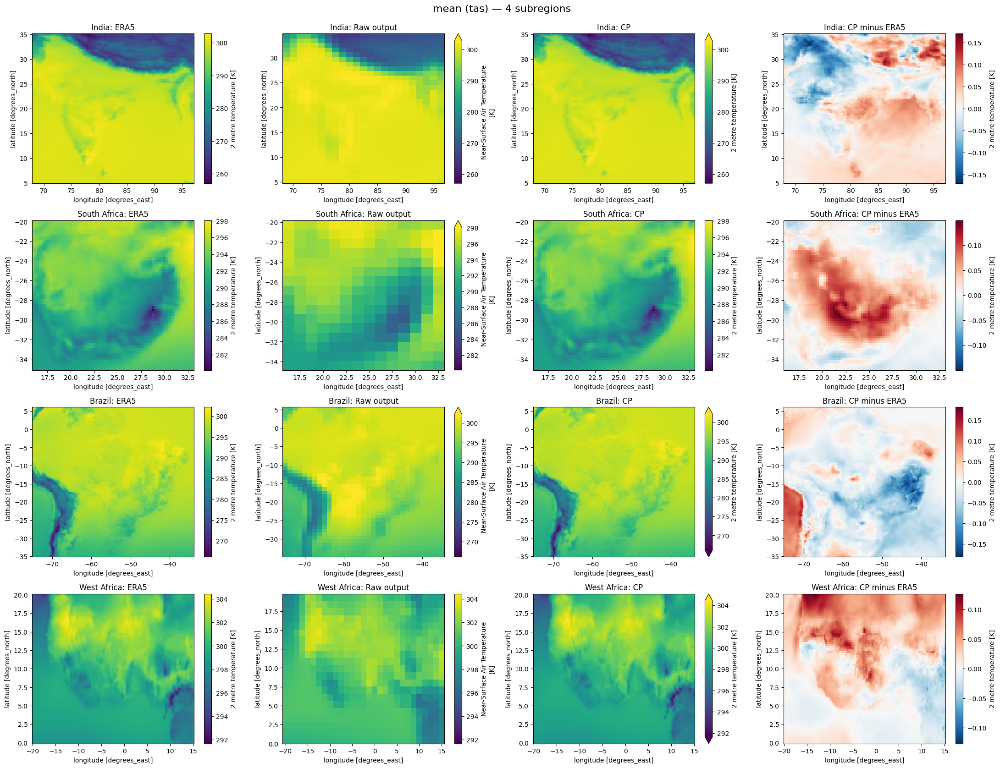

In [21]:
fig = plot_4regions_comparisons(
    raw=raw,
    era5=era5,
    ds1=ds_cp_tas,
    stat="mean",
    variable="tas",
    ds1_title="CP",
)
plt.show()

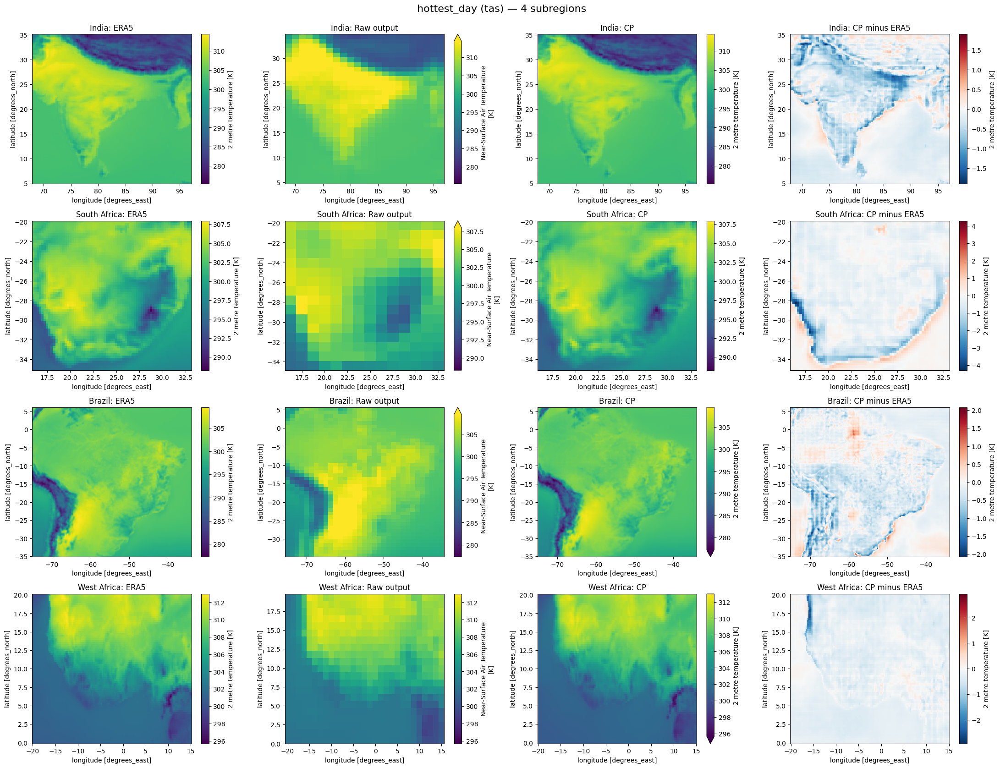

In [22]:
fig = plot_4regions_comparisons(
    raw=raw,
    era5=era5,
    ds1=ds_cp_tas,
    stat="hottest_day",
    variable="tas",
    ds1_title="CP",
)
plt.show()

In [23]:
# temi TODO: write a description here for why we're doing this kind of analysis

## Point-level comparisons

In [24]:
ds_cp = ds_cp_tas.sel(time=training_period)
ds_nn = ds_nn_tas.sel(time=training_period)
era5 = era5.sel(time=training_period)
raw = raw.sel(time=training_period)

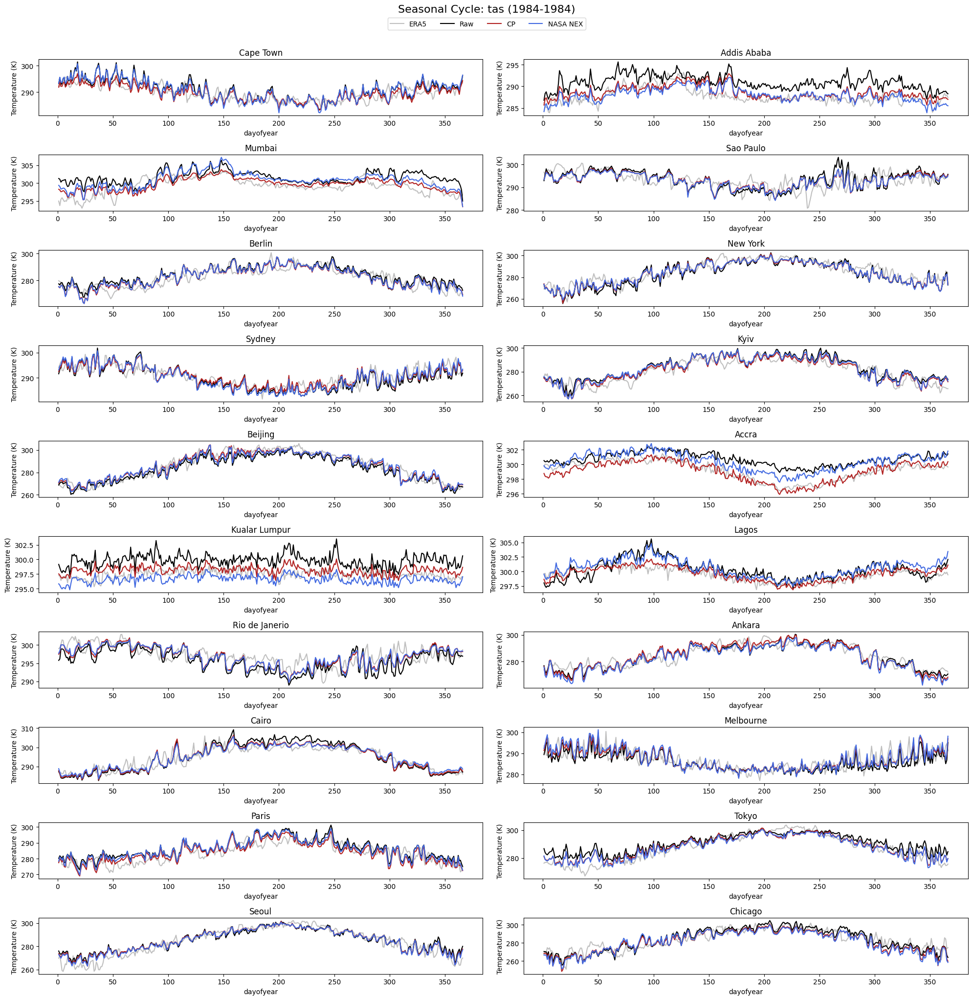

In [ ]:
variable = "tas"
time_slice = slice("1984", "1984")

fig, axarr_shape = plt.subplots(nrows=10, ncols=2, figsize=(20, 20))
axarr = axarr_shape.flatten()
for i, (location, (lat, lon)) in enumerate(locations.items()):
    era5_toplot, raw_toplot, ds_cp_toplot, ds_nn_toplot = prep_datasets_for_seasonal_cycle_plotting(
        era5, raw, ds_cp, time_slice, lat, lon, variable, ds2=ds_nn
    )

    plot_timeseries(axarr[i], era5_toplot, raw_toplot, ds_cp_toplot, location, ds_nn_toplot)
    axarr[i].set_title(location)
    axarr[i].set_ylabel("Temperature (K)")

fig.suptitle(
    f"Seasonal Cycle: {variable} ({time_slice.start}-{time_slice.stop})", fontsize=16, y=1.02
)
fig.legend(
    ["ERA5", "Raw", "CP", "NASA NEX"], loc="upper center", bbox_to_anchor=(0.5, 1.01), ncol=4
)
plt.tight_layout()

In [27]:
ds_list = [era5, raw, ds_cp, ds_nn]

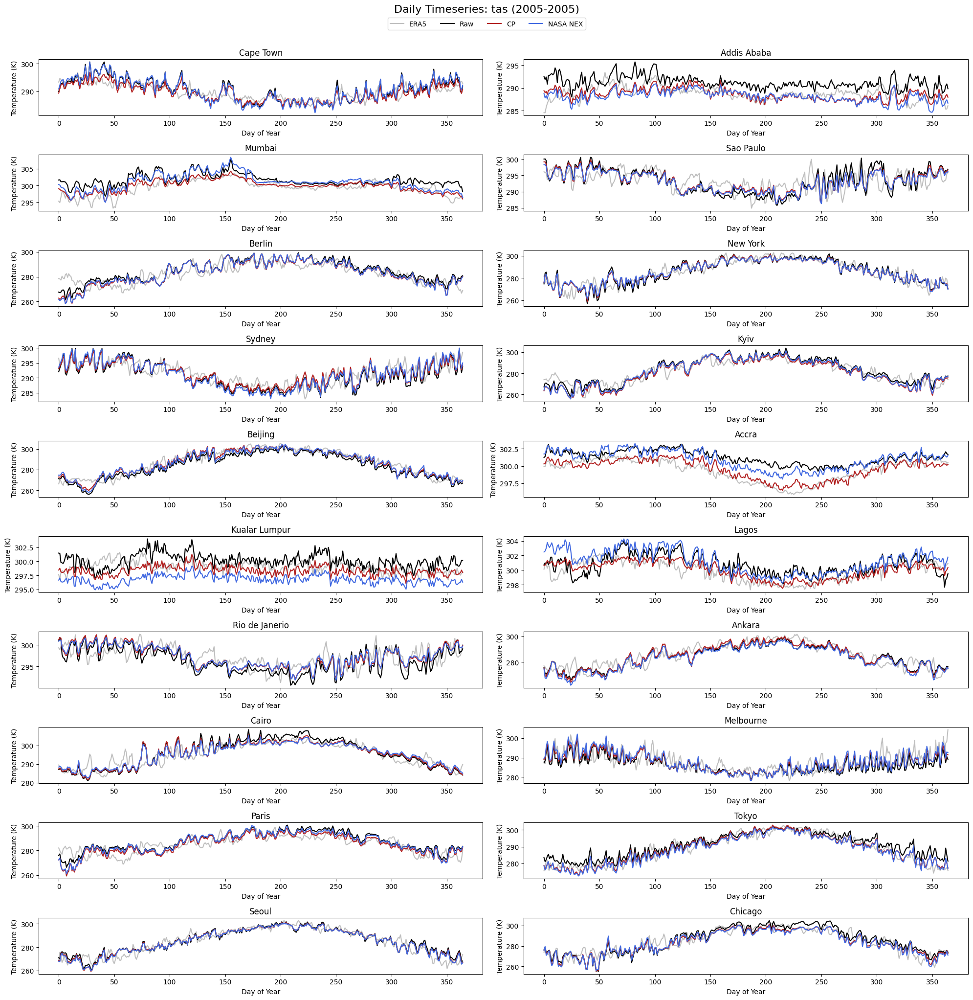

In [ ]:
variable = "tas"
random_year = random_non_leap_year()
time_slice = slice(str(random_year), str(random_year))

fig, axarr_shape = plt.subplots(nrows=10, ncols=2, figsize=(20, 20))
axarr = axarr_shape.flatten()

for i, (location, (lat, lon)) in enumerate(locations.items()):
    # First select time, THEN select point with method='nearest'
    era5_sub = era5.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")
    raw_sub = raw.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")
    ds_cp_sub = ds_cp.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")
    ds_nn_sub = ds_nn.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")

    # Plot using .values to avoid datetime issues
    axarr[i].plot(era5_sub[variable].values, color="grey", alpha=0.5)
    axarr[i].plot(raw_sub[variable].values, color="k")
    axarr[i].plot(ds_cp_sub[variable].values, color="firebrick")
    axarr[i].plot(ds_nn_sub[variable].values, color="royalblue")

    axarr[i].set_title(location)
    axarr[i].set_ylabel("Temperature (K)")
    axarr[i].set_xlabel("Day of Year")

fig.suptitle(
    f"Daily Timeseries: {variable} ({time_slice.start}-{time_slice.stop})", fontsize=16, y=1.02
)
fig.legend(
    ["ERA5", "Raw", "CP", "NASA NEX"], loc="upper center", bbox_to_anchor=(0.5, 1.01), ncol=4
)
plt.tight_layout()
plt.show()

# Compare NASA NEX Future

## Global comparisons

### Mean temperature

In [ ]:
ds_cp_tas_toplot_fut, ds_nn_tas_toplot_fut, raw_tas_toplot_fut = calculate_statistic_to_plot(
    ds_list=[ds_cp_tas_fut, ds_nn_tas_fut, raw_fut], stat="mean", variable="tas"
)

diff1 = ds_cp_tas_toplot_fut - ds_cp_tas_toplot
diff2 = ds_nn_tas_toplot_fut - ds_nn_tas_toplot
diff_raw = raw_tas_toplot_fut - raw_tas_toplot

diff_raw_fine = diff_raw.interp(
    lat=diff1.lat,
    lon=diff1.lon,
    method="linear",  # or "nearest", "cubic"
)

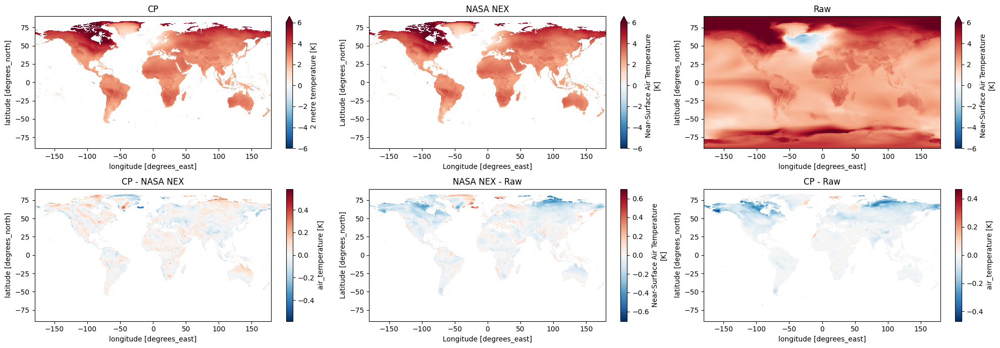

In [30]:
plt.figure(figsize=(20, 7))
plt.subplot(2, 3, 1)
diff1.plot(vmax=6, vmin=-6, cmap=plt.cm.RdBu_r)
plt.title("CP")

plt.subplot(2, 3, 2)
diff2.plot(vmax=6, vmin=-6, cmap=plt.cm.RdBu_r)
plt.title("NASA NEX")

plt.subplot(2, 3, 3)
diff_raw.plot(vmax=6, vmin=-6, cmap=plt.cm.RdBu_r)
plt.title("Raw")

plt.subplot(2, 3, 4)
(diff1 - diff2).plot()
plt.title("CP - NASA NEX")
plt.tight_layout()

plt.subplot(2, 3, 5)
(diff2 - diff_raw_fine).plot()
plt.title("NASA NEX - Raw")
plt.tight_layout()

plt.subplot(2, 3, 6)
(diff1 - diff_raw_fine).plot()
plt.title("CP - Raw")
plt.tight_layout()

### Hottest day

In [ ]:
ds_cp_hottest_day_toplot_fut, ds_nn_hottest_day_toplot_fut, raw_hottest_day_toplot_fut = (
    calculate_statistic_to_plot(
        ds_list=[ds_cp_tas_fut, ds_nn_tas_fut, raw_fut],
        stat="hottest_day",
        variable="tas",
    )
)

diff1 = ds_cp_hottest_day_toplot_fut - ds_cp_hottest_day_toplot
diff2 = ds_nn_hottest_day_toplot_fut - ds_nn_hottest_day_toplot
diff_raw = raw_hottest_day_toplot_fut - raw_hottest_day_toplot

diff_raw_fine = diff_raw.interp(
    lat=diff1.lat,
    lon=diff1.lon,
    method="linear",  # or "nearest", "cubic"
)

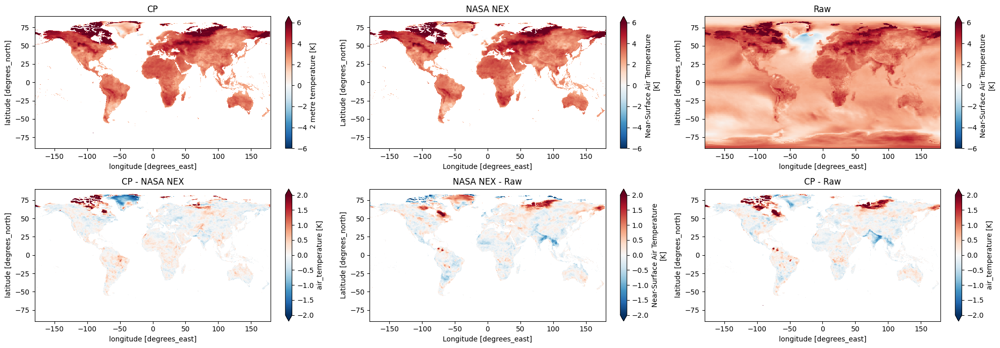

In [32]:
plt.figure(figsize=(20, 7))
plt.subplot(2, 3, 1)
diff1.plot(vmax=6, vmin=-6, cmap=plt.cm.RdBu_r)
plt.title("CP")

plt.subplot(2, 3, 2)
diff2.plot(vmax=6, vmin=-6, cmap=plt.cm.RdBu_r)
plt.title("NASA NEX")

plt.subplot(2, 3, 3)
diff_raw.plot(vmax=6, vmin=-6, cmap=plt.cm.RdBu_r)
plt.title("Raw")

plt.subplot(2, 3, 4)
(diff1 - diff2).plot(vmax=2, vmin=-2, cmap=plt.cm.RdBu_r)
plt.title("CP - NASA NEX")
plt.tight_layout()

plt.subplot(2, 3, 5)
(diff2 - diff_raw_fine).plot(vmax=2, vmin=-2, cmap=plt.cm.RdBu_r)
plt.title("NASA NEX - Raw")

plt.subplot(2, 3, 6)
(diff1 - diff_raw_fine).plot(vmax=2, vmin=-2, cmap=plt.cm.RdBu_r)
plt.title("CP - Raw")
plt.tight_layout()

### Days over 30C

In [ ]:
ds_cp_over30C_toplot_fut, ds_nn_over30C_toplot_fut, raw_over30C_toplot_fut = (
    calculate_statistic_to_plot(
        ds_list=[ds_cp_tas_fut, ds_nn_tas_fut, raw_fut],
        stat="days_over_30C",
        variable="tas",
    )
)

diff1 = ds_cp_over30C_toplot_fut - ds_cp_over30C_toplot
diff2 = ds_nn_over30C_toplot_fut - ds_nn_over30C_toplot
diff_raw = raw_over30C_toplot_fut - raw_over30C_toplot

diff_raw_fine = diff_raw.interp(
    lat=diff1.lat,
    lon=diff1.lon,
    method="linear",  # or "nearest", "cubic"
)

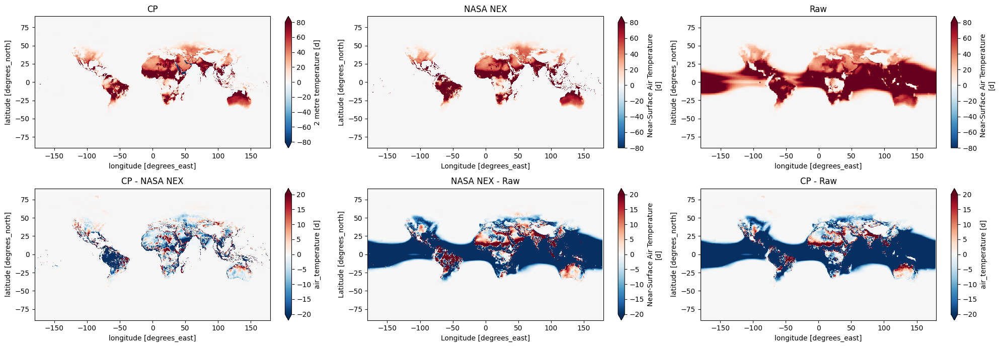

In [34]:
plt.figure(figsize=(20, 7))
plt.subplot(2, 3, 1)
diff1.plot(vmax=80, vmin=-80, cmap=plt.cm.RdBu_r)
plt.title("CP")

plt.subplot(2, 3, 2)
diff2.plot(vmax=80, vmin=-80, cmap=plt.cm.RdBu_r)
plt.title("NASA NEX")

plt.subplot(2, 3, 3)
diff_raw.plot(vmax=80, vmin=-80, cmap=plt.cm.RdBu_r)
plt.title("Raw")

plt.subplot(2, 3, 4)
(diff1 - diff2).plot(vmax=20, vmin=-20, cmap=plt.cm.RdBu_r)
plt.title("CP - NASA NEX")
plt.tight_layout()

plt.subplot(2, 3, 5)
(diff2 - diff_raw_fine).plot(vmax=20, vmin=-20, cmap=plt.cm.RdBu_r)
plt.title("NASA NEX - Raw")

plt.subplot(2, 3, 6)
(diff1 - diff_raw_fine).plot(vmax=20, vmin=-20, cmap=plt.cm.RdBu_r)
plt.title("CP - Raw")
plt.tight_layout()

## Point-level comparison

### Time series

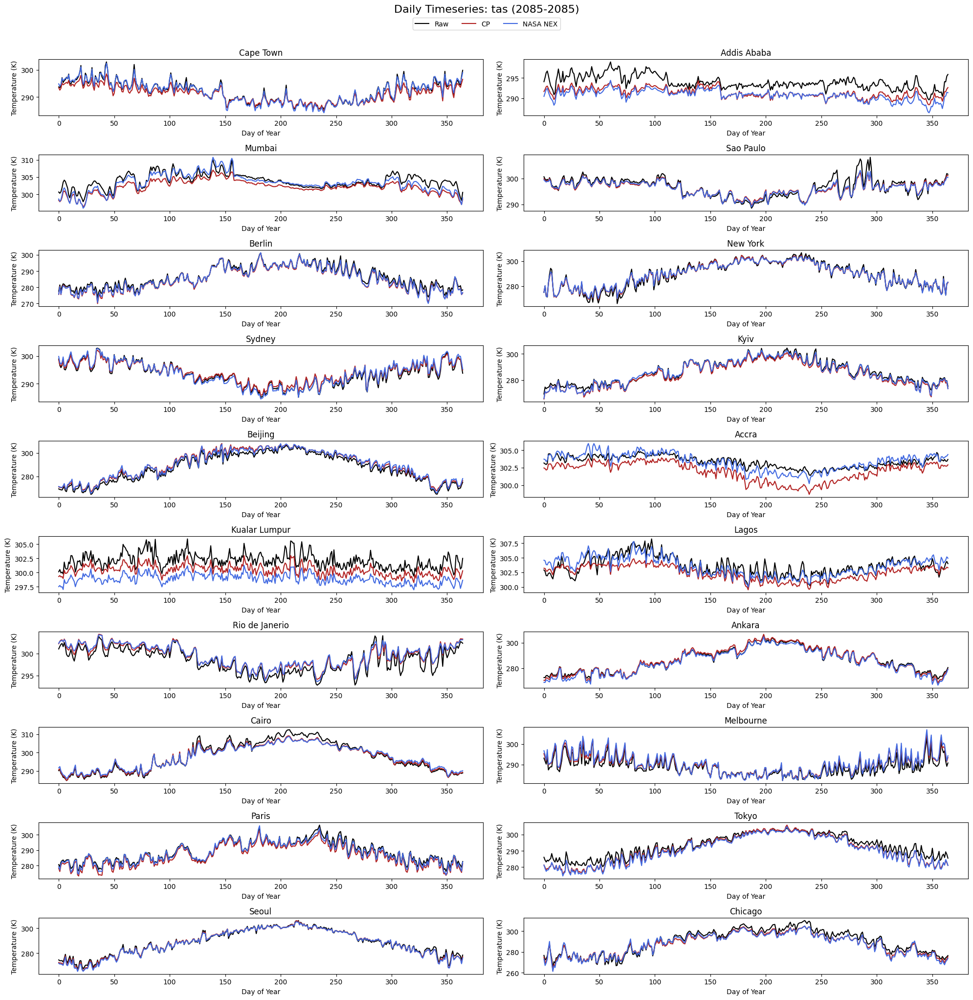

In [ ]:
variable = "tas"
time_slice = slice(str(2085), str(2085))

fig, axarr_shape = plt.subplots(nrows=10, ncols=2, figsize=(20, 20))
axarr = axarr_shape.flatten()

for i, (location, (lat, lon)) in enumerate(locations.items()):
    # First select time, THEN select point with method='nearest'
    raw_sub = raw_fut.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")
    ds_cp_sub = ds_cp_tas_fut.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")
    ds_nn_sub = ds_nn_tas_fut.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")

    # Plot using .values to avoid datetime issues
    axarr[i].plot(raw_sub[variable].values, color="k")
    axarr[i].plot(ds_cp_sub[variable].values, color="firebrick")
    axarr[i].plot(ds_nn_sub[variable].values, color="royalblue")

    axarr[i].set_title(location)
    axarr[i].set_ylabel("Temperature (K)")
    axarr[i].set_xlabel("Day of Year")

fig.suptitle(
    f"Daily Timeseries: {variable} ({time_slice.start}-{time_slice.stop})", fontsize=16, y=1.02
)
fig.legend(["Raw", "CP", "NASA NEX"], loc="upper center", bbox_to_anchor=(0.5, 1.01), ncol=4)
plt.tight_layout()
plt.show()

### Scatter plots: comparison to raw data and NASA nex

In [32]:
ds_cp_1pt_list = []
ds_nn_1pt_list = []
raw_1pt_list = []
ds_cp_1pt_hist_clim_list = []
ds_nn_1pt_hist_clim_list = []
raw_1pt_hist_clim_list = []

for i, (location, (lat, lon)) in enumerate(locations.items()):
    print(i)
    ds_cp_1pt = ds_cp_tas_fut["tas"].sel(lat=lat, lon=lon, method="nearest")[:-365].load()
    ds_nn_1pt = ds_nn_tas_fut["tas"].sel(lat=lat, lon=lon, method="nearest").load()
    raw_1pt = raw_fut["tas"].sel(lat=lat, lon=lon, method="nearest")[:-365].load()

    ds_cp_1pt_hist_clim = (
        ds_cp_tas["tas"]
        .sel(lat=lat, lon=lon, method="nearest")
        .groupby("time.dayofyear")
        .mean(dim="time")
    )
    ds_nn_1pt_hist_clim = (
        ds_nn_tas["tas"]
        .sel(lat=lat, lon=lon, method="nearest")
        .groupby("time.dayofyear")
        .mean(dim="time")
    )
    raw_1pt_hist_clim = (
        raw["tas"]
        .sel(lat=lat, lon=lon, method="nearest")
        .groupby("time.dayofyear")
        .mean(dim="time")
    )

    ds_cp_1pt_list.append(ds_cp_1pt)
    ds_nn_1pt_list.append(ds_nn_1pt)
    raw_1pt_list.append(raw_1pt)
    ds_cp_1pt_hist_clim_list.append(ds_cp_1pt_hist_clim)
    ds_nn_1pt_hist_clim_list.append(ds_nn_1pt_hist_clim)
    raw_1pt_hist_clim_list.append(raw_1pt_hist_clim)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


In [37]:
for i, (location, (lat, lon)) in enumerate(locations.items()):
    ds_nn_1pt_list[i] = ds_nn_1pt_list[i].load()

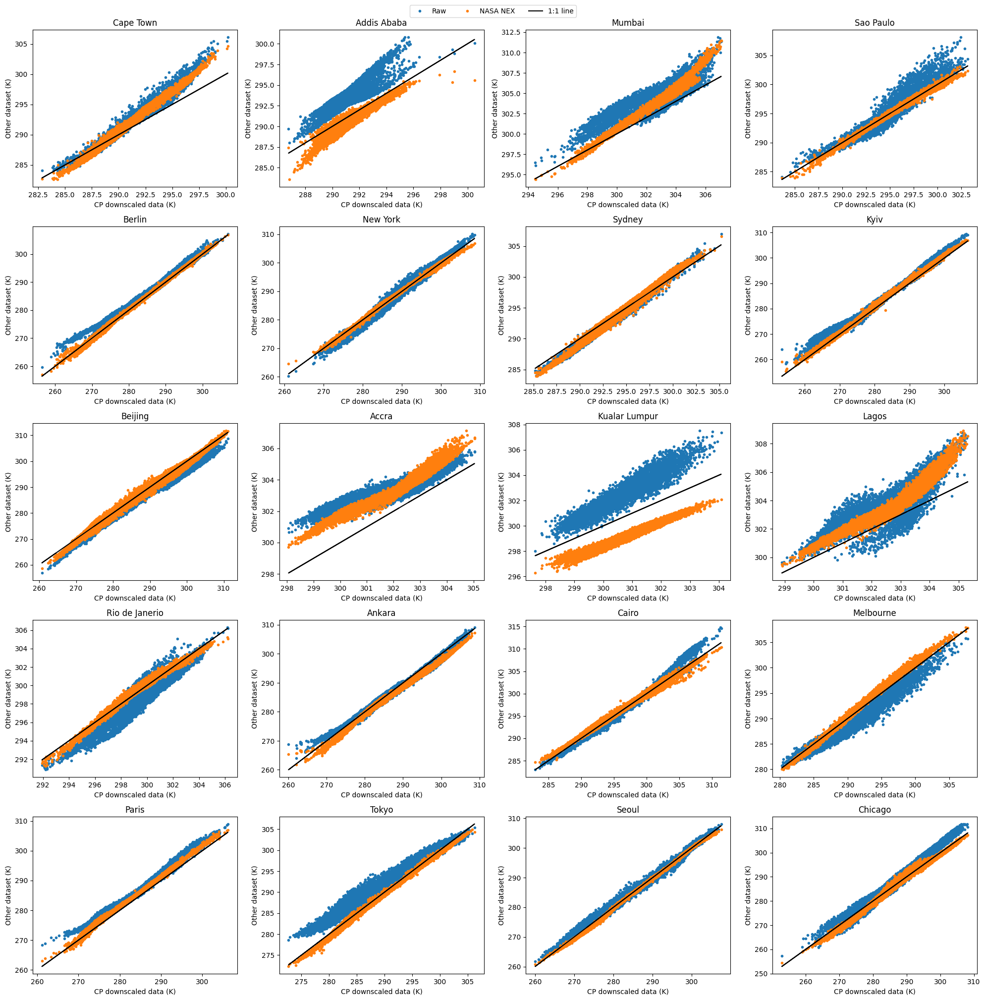

In [40]:
fig, axarr_shape = plt.subplots(nrows=5, ncols=4, figsize=(20, 20))
axarr = axarr_shape.flatten()
for i, (location, (lat, lon)) in enumerate(locations.items()):
    ds_cp_1pt = ds_cp_1pt_list[i]
    ds_nn_1pt = ds_nn_1pt_list[i]
    raw_1pt = raw_1pt_list[i]
    axarr[i].plot(ds_cp_1pt, raw_1pt, ".", label="Raw model output")

    axarr[i].plot(ds_cp_1pt, ds_nn_1pt, ".", label="NASA NEX")

    axarr[i].plot(ds_cp_1pt, ds_cp_1pt, "-k", label="1:1 line")
    axarr[i].set_title(location)
    axarr[i].set_ylabel("Other dataset (K)")
    axarr[i].set_xlabel("CP downscaled data (K)")
fig.legend(["Raw", "NASA NEX", "1:1 line"], loc="upper center", bbox_to_anchor=(0.5, 1.01), ncol=4)
plt.tight_layout()

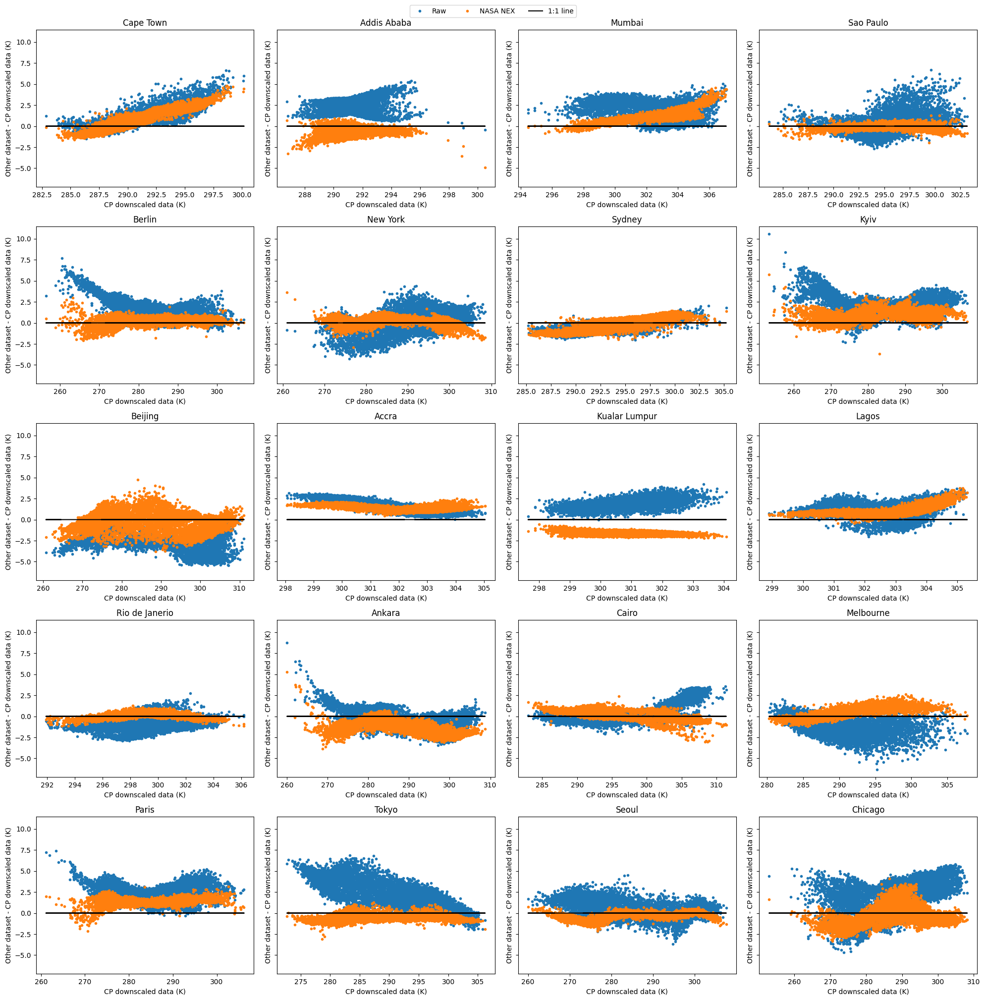

In [42]:
fig, axarr_shape = plt.subplots(nrows=5, ncols=4, figsize=(20, 20), sharey=True)
axarr = axarr_shape.flatten()
for i, (location, (lat, lon)) in enumerate(locations.items()):
    ds_cp_1pt = ds_cp_1pt_list[i]
    ds_nn_1pt = ds_nn_1pt_list[i]
    raw_1pt = raw_1pt_list[i]
    axarr[i].plot(ds_cp_1pt, raw_1pt - ds_cp_1pt, ".", label="Raw model output")

    axarr[i].plot(ds_cp_1pt, ds_nn_1pt - ds_cp_1pt, ".", label="NASA NEX")

    axarr[i].plot(ds_cp_1pt, ds_cp_1pt - ds_cp_1pt, "-k", label="zero line")
    axarr[i].set_title(location)
    axarr[i].set_ylabel("Other dataset - CP downscaled data (K)")
    axarr[i].set_xlabel("CP downscaled data (K)")
fig.legend(["Raw", "NASA NEX", "1:1 line"], loc="upper center", bbox_to_anchor=(0.5, 1.01), ncol=4)
plt.tight_layout()

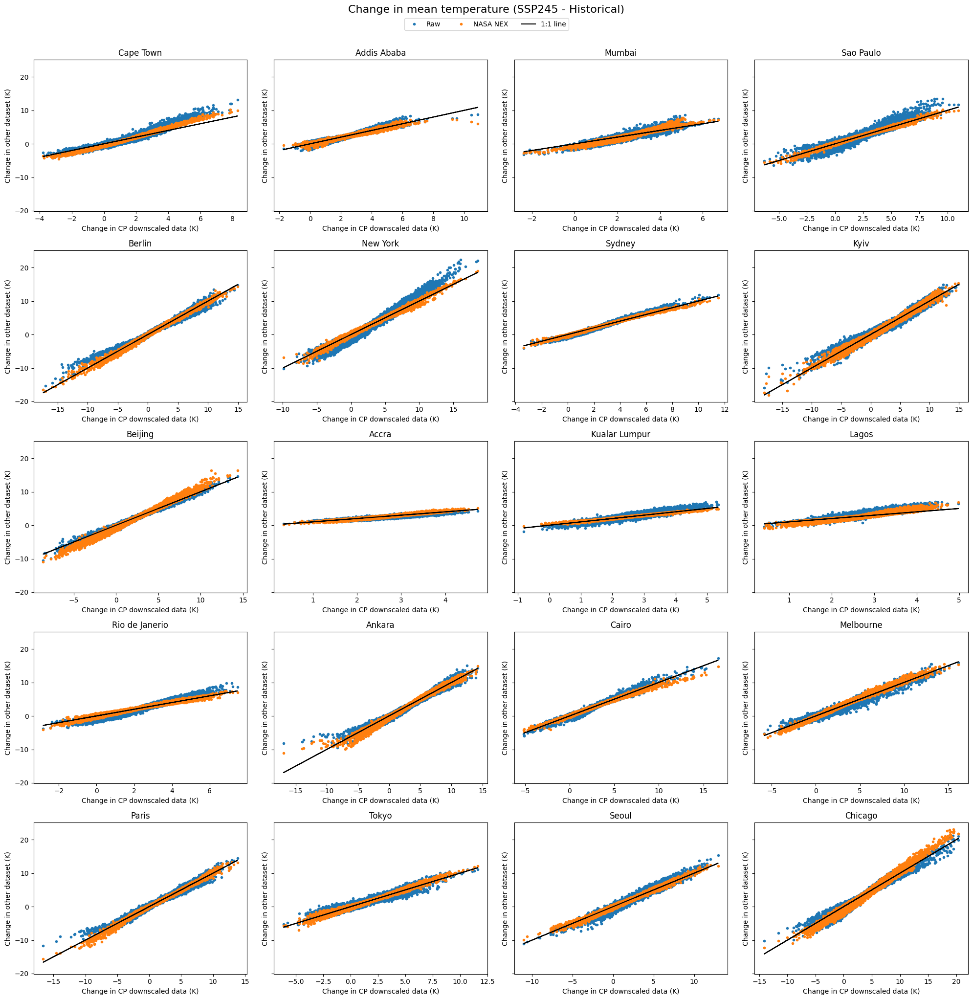

In [43]:
fig, axarr_shape = plt.subplots(nrows=5, ncols=4, figsize=(20, 20), sharey=True)
axarr = axarr_shape.flatten()
for i, (location, (lat, lon)) in enumerate(locations.items()):
    ds_cp_1pt_hist_clim = ds_cp_1pt_hist_clim_list[i]
    ds_nn_1pt_hist_clim = ds_nn_1pt_hist_clim_list[i]
    raw_1pt_hist_clim = raw_1pt_hist_clim_list[i]

    ds_cp_1pt = ds_cp_1pt_list[i]
    ds_nn_1pt = ds_nn_1pt_list[i]
    raw_1pt = raw_1pt_list[i]

    ds_cp_1pt_anom = ((ds_cp_1pt).groupby("time.dayofyear") - ds_cp_1pt_hist_clim).load()
    ds_nn_1pt_anom = ((ds_nn_1pt).groupby("time.dayofyear") - ds_nn_1pt_hist_clim).load()
    raw_1pt_anom = ((raw_1pt).groupby("time.dayofyear") - raw_1pt_hist_clim).load()

    axarr[i].plot(ds_cp_1pt_anom, raw_1pt_anom, ".", label="Raw model output")

    axarr[i].plot(ds_cp_1pt_anom, ds_nn_1pt_anom, ".", label="NASA NEX")

    axarr[i].plot(ds_cp_1pt_anom, ds_cp_1pt_anom, "-k", label="zero line")
    axarr[i].set_title(location)
    axarr[i].set_ylabel("Change in other dataset (K)")
    axarr[i].set_xlabel("Change in CP downscaled data (K)")
fig.suptitle("Change in mean temperature (SSP245 - Historical)", fontsize=16, y=1.02)
fig.legend(["Raw", "NASA NEX", "1:1 line"], loc="upper center", bbox_to_anchor=(0.5, 1.01), ncol=4)
plt.tight_layout()

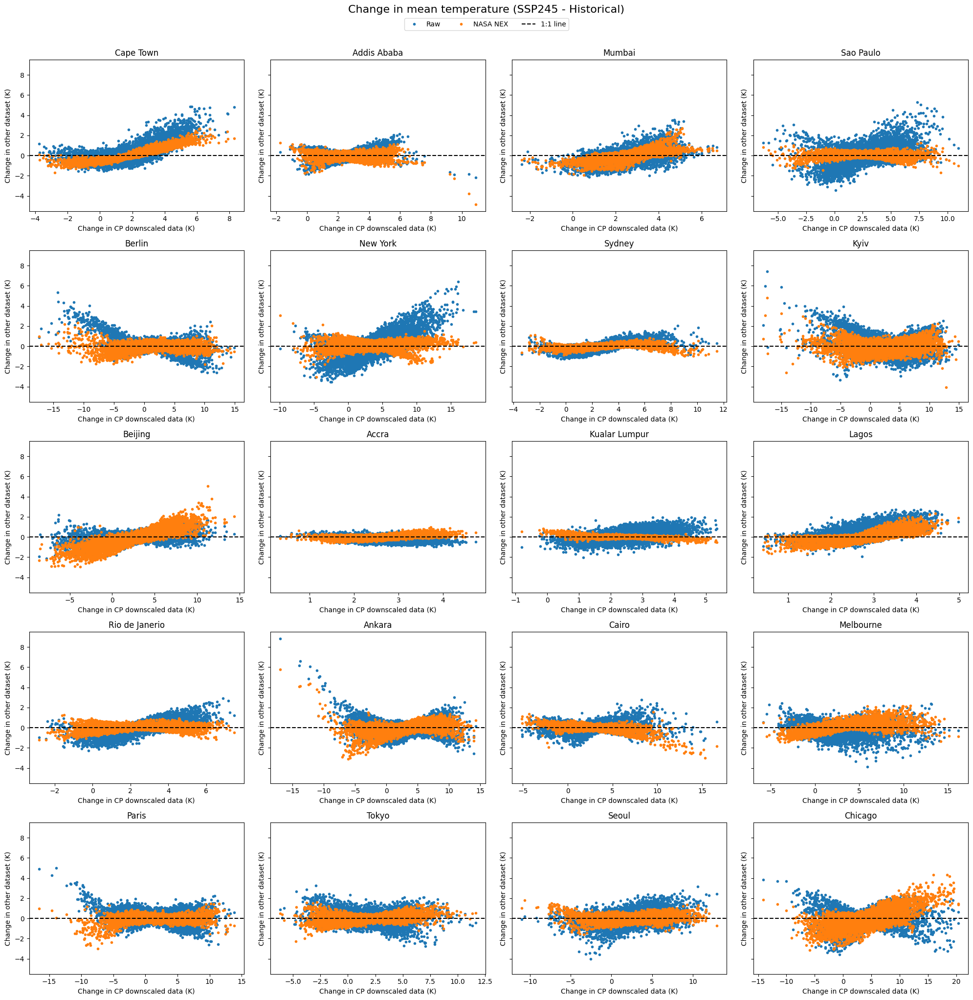

In [49]:
fig, axarr_shape = plt.subplots(nrows=5, ncols=4, figsize=(20, 20), sharey=True)
axarr = axarr_shape.flatten()
for i, (location, (lat, lon)) in enumerate(locations.items()):
    ds_cp_1pt_hist_clim = ds_cp_1pt_hist_clim_list[i]
    ds_nn_1pt_hist_clim = ds_nn_1pt_hist_clim_list[i]
    raw_1pt_hist_clim = raw_1pt_hist_clim_list[i]

    ds_cp_1pt = ds_cp_1pt_list[i]
    ds_nn_1pt = ds_nn_1pt_list[i]
    raw_1pt = raw_1pt_list[i]

    ds_cp_1pt_anom = ((ds_cp_1pt).groupby("time.dayofyear") - ds_cp_1pt_hist_clim).load()
    ds_nn_1pt_anom = ((ds_nn_1pt).groupby("time.dayofyear") - ds_nn_1pt_hist_clim).load()
    raw_1pt_anom = ((raw_1pt).groupby("time.dayofyear") - raw_1pt_hist_clim).load()

    axarr[i].plot(ds_cp_1pt_anom, raw_1pt_anom - ds_cp_1pt_anom, ".", label="Raw model output")

    axarr[i].plot(ds_cp_1pt_anom, ds_nn_1pt_anom - ds_cp_1pt_anom, ".", label="NASA NEX")

    axarr[i].axhline(y=0, linestyle="--", color="k")
    axarr[i].set_title(location)
    axarr[i].set_ylabel("Change in other dataset (K)")
    axarr[i].set_xlabel("Change in CP downscaled data (K)")
fig.suptitle("Change in mean temperature (SSP245 - Historical)", fontsize=16, y=1.02)
fig.legend(["Raw", "NASA NEX", "1:1 line"], loc="upper center", bbox_to_anchor=(0.5, 1.01), ncol=4)
plt.tight_layout()

Text(0, 0.5, 'Hottest day of the year (K)')

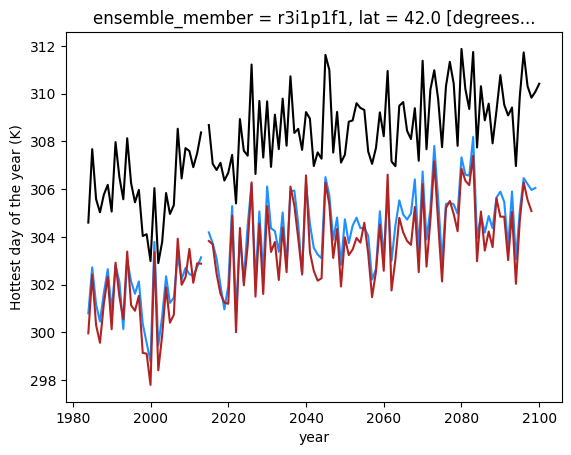

In [31]:
hday_raw_1pt_hist = (
    raw["tas"].sel(lat=lat, lon=lon, method="nearest").groupby("time.year").max()[:-1].load()
)
hday_cp_1pt_hist = (
    ds_cp_tas["tas"].sel(lat=lat, lon=lon, method="nearest").groupby("time.year").max()[:-1].load()
)
hday_nn_1pt_hist = (
    ds_nn_tas["tas"].sel(lat=lat, lon=lon, method="nearest").groupby("time.year").max()[:-1].load()
)

hday_raw_1pt = (
    raw_fut_full["tas"]
    .sel(lat=lat, lon=lon, method="nearest")
    .groupby("time.year")
    .max()[:-1]
    .load()
)
hday_cp_1pt = (
    ds_cp_tas_fut_full["tas"]
    .sel(lat=lat, lon=lon, method="nearest")
    .groupby("time.year")
    .max()[:-1]
    .load()
)
hday_nn_1pt = (
    ds_nn_tas_fut_full["tas"]
    .sel(lat=lat, lon=lon, method="nearest")
    .groupby("time.year")
    .max()[:-1]
    .load()
)

hday_raw_1pt_hist.plot(color="k")
hday_raw_1pt.plot(color="k")
hday_cp_1pt_hist.plot(color="dodgerblue")
hday_cp_1pt.plot(color="dodgerblue")
hday_nn_1pt_hist.plot(color="firebrick")
hday_nn_1pt.plot(color="firebrick")
plt.ylabel("Hottest day of the year (K)")